# Applying transformations to Geoscience Australia's Sentinel-1 IW Normalised Radar Backscatter (collection 0)

This notebook demonstrates a number of ways that you can apply algorithms to Normalised Radar Backscatter data to support analysis.
The key transformations are:
* Applying a speckle filter
* Masking
* Converting to different normalisation conventions (beta0 and sigma0)
* Converting to decibels

## Set-up

For this notebook, you will choose upfront if you want to run the STAC approach, or the Datacube approach.
Uncomment the approach you wish to run, leaving the other approach commented.

In [1]:
approach = "stac"
# approach = "datacube"

### Import required libraries

This imports python libraries that are used in both approaches, as well as any that are specific to the chosen approach

In [2]:
import matplotlib.pyplot as plt
import numpy as np
from odc.geo import BoundingBox
import odc.geo.xr
import pathlib
import xarray as xr
from dea_tools.plotting import rgb

if approach == "stac":
    from pystac_client import Client
    from odc.stac import load, configure_s3_access

if approach == "datacube": 
    import datacube

### Environment set up

In [3]:
if approach == "stac":
    catalog = "https://explorer.dev.dea.ga.gov.au/stac"
    stac_client = Client.open(catalog)
    configure_s3_access(cloud_defaults=True, aws_unsigned=True)

if approach == "datacube": 
    dc = datacube.Datacube(env="dev", app="S1_Backscatter_Demo")

## Searching and Loading

For this demo, we have hard-coded the loading for a single burst over Tennant Creek, in the Northern Territory.
To learn more about how to customise loading, check the following notebooks:

* [02_demonstration.ipynb](02_demonstration.ipynb)
* [03_loading_with_stac.ipynb](03_loading_with_stac.ipynb)
* [04_loading_with_datacube.ipynb](04_loading_with_datacube.ipynb)

In the loads, we specify no measurements so that all measurements are returned.

In [4]:
aoi_bbox = BoundingBox(
    left=153.12545,
    bottom=-28.26918,
    right=153.24852,
    top=-28.17404,
    crs="EPSG:4326"
)

start_date = "2024-06-01"
end_date = "2024-06-15"

product_to_load = "ga_s1_nrb_iw_vv_vh_0"
output_crs = "EPSG:3577"
output_res = 20 # metres
group_by = "solar_day"

aoi_bbox.explore()

In [5]:
if approach == "stac":

    stac_items = stac_client.search(
        collections=[product_to_load],
        datetime=f"{start_date}/{end_date}",
        bbox=aoi_bbox.bbox,
    ).item_collection()

    print(f"Found {len(stac_items)} items")

    ds = load(
        items=stac_items,
        intersects=aoi_bbox.boundary(),
        crs=output_crs,
        resolution=output_res,
        groupby="solar_day",
        chunks={},
    )

if approach == "datacube":
    ds = dc.load(
        product=product_to_load,
        lat=(aoi_bbox.bottom, aoi_bbox.top),
        lon=(aoi_bbox.left, aoi_bbox.right),
        output_crs=output_crs,
        resolution=(output_res, -output_res),
        time=(start_date, end_date),
        group_by="solar_day",
        dask_chunks={}
    )

ds

Found 8 items


<xarray.Dataset> Size: 27MB
Dimensions:                 (y: 626, x: 677, time: 2)
Coordinates:
  * y                       (y) float64 5kB -3.228e+06 -3.228e+06 ... -3.24e+06
  * x                       (x) float64 5kB 2.038e+06 2.038e+06 ... 2.052e+06
    spatial_ref             int32 4B 3577
  * time                    (time) datetime64[ns] 16B 2024-06-07T19:06:25.259...
Data variables:
    mask                    (time, y, x) float32 3MB dask.array<chunksize=(1, 626, 677), meta=np.ndarray>
    VH_gamma0               (time, y, x) float32 3MB dask.array<chunksize=(1, 626, 677), meta=np.ndarray>
    VV_gamma0               (time, y, x) float32 3MB dask.array<chunksize=(1, 626, 677), meta=np.ndarray>
    incidence_angle         (time, y, x) float32 3MB dask.array<chunksize=(1, 626, 677), meta=np.ndarray>
    number_of_looks         (time, y, x) float32 3MB dask.array<chunksize=(1, 626, 677), meta=np.ndarray>
    gamma0_to_beta0_ratio   (time, y, x) float32 3MB dask.array<chunksize=(1, 626, 677), meta=np.ndarray>
    local_incidence_angle   (time, y, x) float32 3MB dask.array<chunksize=(1, 626, 677), meta=np.ndarray>
    gamma0_to_sigma0_ratio  (time, y, x) float32 3MB dask.array<chunksize=(1, 626, 677), meta=np.ndarray>

## Speckle filtering

### What is speckle?
Speckle is a type of noise in SAR images that comes from observing multiple different scatterers within a single pixel. 
This manifests as differences in phase for light received across the pixel, resulting in interference.
* If the phase from multiple scatterers lines up (constructive interference), then the pixel will appear brighter than expected.
* If the phase from multiple scatterers doesn't line up (destructive interference), then the pixel will appear darker than expected.

Importantly, this means that even though you may illuminate a uniformly covered area (like a field or water body), there will still be constructive and destructive interference within any given pixel, resulting in a salt-and-pepper effect where pixels alternate between bright and dark across the area. 
The image below shows an example of a field with the effect of speckle visible across the image.

![The effect of speckle in SAR images.](https://www.researchgate.net/profile/Patrick-Leinenkugel/publication/225006983/figure/fig7/AS:669473518391311@1536626333606/Speckle-in-radar-images.jpg)

*Credit:* Leinenkugel, Patrick. (2010). [The Combined Use of Optical and SAR Data for Large Area Impervious Surface Mapping.](https://www.researchgate.net/publication/225006983_The_Combined_Use_of_Optical_and_SAR_Data_for_Large_Area_Impervious_Surface_Mapping) 


### Speckle filters

Multiple algorithms have been developed to help reduce speckle in SAR imagery, which can assist with image analysis and interpretation. 

#### Lee Filter

A commonly used (and easy to implement) filter is the Lee filter, developed by [Jong-Sen Lee in 1980](https://ieeexplore.ieee.org/document/4766994). 
The filter is applied per pixel, and involves calculating the mean and variance of the pixels in a given window around the pixel. 
We provide an implementation in [speckle_filters.py](speckle_filters.py), along with a function that applies the filter to Xarray DataArrays.
A demonstration is shown below, with a window size of 3 pixels.

For ease here, we will just apply the filter to the unaltered backscatter data. 
The [02_demonstration.ipynb](02_demonstration.ipynb) notebook shows the typical end-to-end workflow of preparing data for analysis.

In [6]:
import sys
sys.path.insert(1, '../src/')
from speckle_filters import apply_lee_filter

ds["VV_gamma0_filtered"] = apply_lee_filter(ds["VV_gamma0"], size=3)

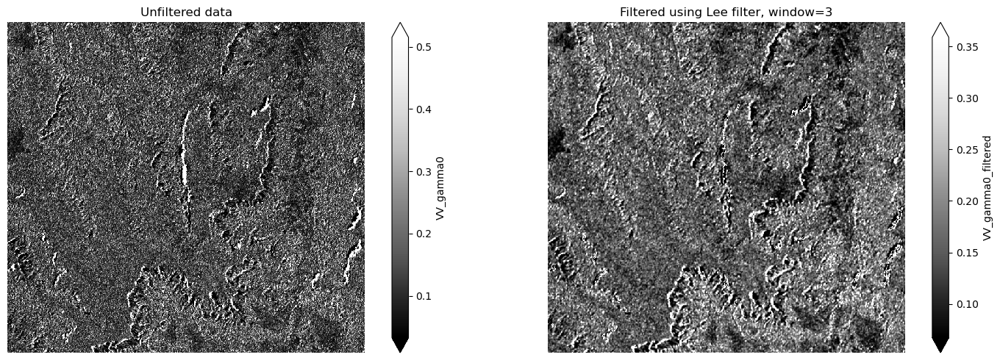

In [7]:
# Visualise
unfiltered = ds.isel(time=0)["VV_gamma0"]
filtered = ds.isel(time=0)["VV_gamma0_filtered"]

# Define figure
fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(15, 5), sharex=True, sharey=True)

# Display unfiltered
unfiltered.plot(ax=ax0, cmap="Greys_r", robust=True)
ax0.set_aspect("equal")
ax0.set_title("Unfiltered data")
ax0.axis("off")

# Display filtered
filtered.plot(ax=ax1, cmap="Greys_r", robust=True)
ax1.set_aspect("equal")
ax1.set_title("Filtered using Lee filter, window=3")
ax1.axis("off")

plt.tight_layout()
plt.show()

## Masking

The GA Sentinel-1 backscatter product comes with a mask that indicates invalid pixels, along with pixels impacted by layover and shadow. 

The masks have the following values:
| Value | Property |
| --- | ----------- |
| 0 | Valid | 
| 1 | Shadow |
| 2 | Layover |
| 3 | Shadow and layover |
| 255 / NaN | Invalid |

The following code displays the masks and shows how to apply them.

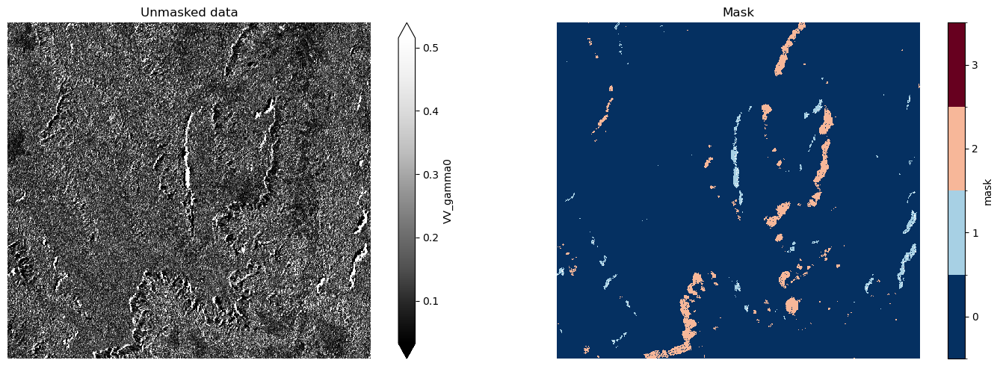

In [8]:
# Visualise
unmasked = ds.isel(time=0)["VV_gamma0"]
mask = ds.isel(time=0)["mask"]

# Define figure
fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(15, 5), sharex=True, sharey=True)

# Display unfiltered
unmasked.plot(ax=ax0, cmap="Greys_r", robust=True)
ax0.set_aspect("equal")
ax0.set_title("Unmasked data")
ax0.axis("off")

# Display filtered
mask.plot(ax=ax1, levels=[-0.5, 0.5, 1.5, 2.5, 3.5], cbar_kwargs={'ticks': [0, 1, 2, 3]})
ax1.set_aspect("equal")
ax1.set_title("Mask")
ax1.axis("off")

plt.tight_layout()
plt.show()

### Applying the mask

To apply the mask, we use xarray's where function, which takes the condition, followed by the values to keep if the condition is true, followed by the values to use if the condition is false. 
The following code creates a new band, `VV_gamma0_masked`, that keeps the original `VV_gamma0` values where the mask is equal to 0, and replaces values with NaN otherwise.

For ease here, we will just apply the mask to the unaltered backscatter data.
The [02_demonstration.ipynb](02_demonstration.ipynb) notebook shows the typical end-to-end workflow of preparing data for analysis.

In [9]:
ds["VV_gamma0_masked"] = xr.where(ds.mask==0, ds["VV_gamma0"], np.nan)

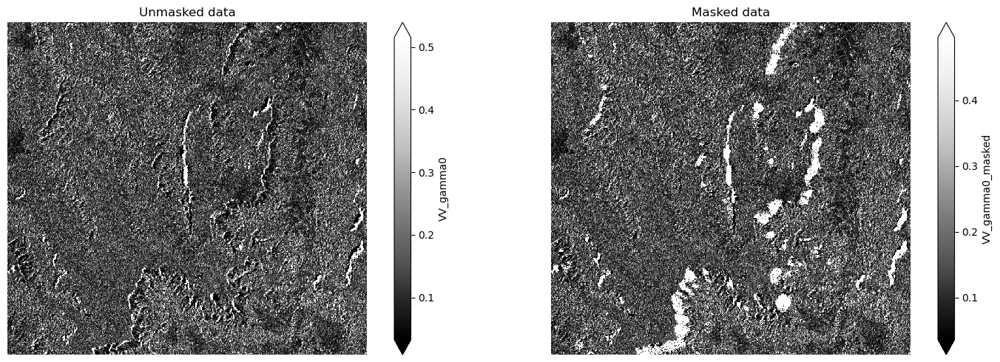

In [10]:
# Visualise
unmasked = ds.isel(time=0)["VV_gamma0"]
masked = ds.isel(time=0)["VV_gamma0_masked"]

# Define figure
fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(15, 5), sharex=True, sharey=True)

# Display unfiltered
unmasked.plot(ax=ax0, cmap="Greys_r", robust=True)
ax0.set_aspect("equal")
ax0.set_title("Unmasked data")
ax0.axis("off")

# Display filtered
masked.plot(ax=ax1, cmap="Greys_r", robust=True)
ax1.set_aspect("equal")
ax1.set_title("Masked data")
ax1.axis("off")

plt.tight_layout()
plt.show()

## Converting to different normalisation conventions

Because SAR is a side-looking sensor, the captured backscatter is affected by the viewing angle, as well as the angle of the terrain producing the backscatter. 
Together these factors are captured by a measurement called the incidence angle.

It is common practice to normalise backscatter to get a representation of the backscatter strength per unit area.
However, these is not just one way to do this, but four, and different normalisation conventions may be preferred for different use cases (such as observing hilly terrain vs flat sea-ice). 
As such, normalised radar backscatter can be provided as the following coefficients:

| Coefficient | Normalisation | Common use case |
| ----------- | ------------- | --------------- |
| $\gamma^0$ (gamma0) | Relative to ground area projected in radar line-of-sight. | Land, especially over rugged terrain. Minimises the effect of incidence angle. |
| $\sigma^0$ (sigma0) | Relative to the ground area. | Flat areas, especially sea ice and ocean. Can either account for, or ignore terrain (see below). |
| $\beta^0$ (beta0) | Relative to the radar slant-range area. | Calibration, or as an intermediate product for other conventions. |

Over land, the most common normalisation convention is $\gamma^0$ (gamma0), which is the primary convention we provide for the product. 
Out of all normalisation conventions, $\gamma^0$ has the lowest sensitivity to incidence angle (the angle between the sensor and the normal vector for the Earth's surface).

Depending on your use case, you may prefer to use a different convention.
The codes below show how to convert the $\gamma^0$ value to a different convention.

### Converting from $\gamma^0$ to $\beta^0$

While not commonly used in applications, $\beta^0$ can also be a useful intermediate product when converting to $\sigma^0$. 

For this conversion, we supply the `gamma0_to_beta0_ratio` measurement, which provides a per-pixel conversion factor.
The conversion equation is

$$
\begin{aligned} 
\beta^0 &= \gamma^0 \times \text{gamma0\_to\_beta0\_ratio}\\ 
\end{aligned}
$$

In [11]:
ds["VV_beta0"] = ds["VV_gamma0"] * ds["gamma0_to_beta0_ratio"]

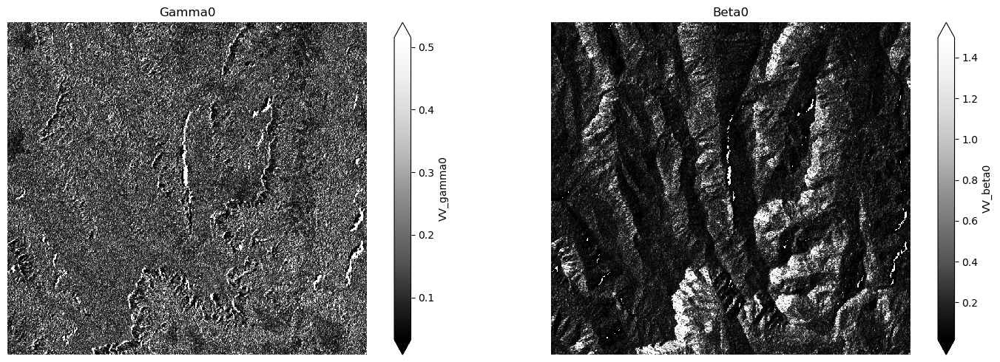

In [12]:
# Visualise
gamma0 = ds.isel(time=0)["VV_gamma0"]
beta0 = ds.isel(time=0)["VV_beta0"]

# Define figure
fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(15, 5), sharex=True, sharey=True)

# Display unfiltered
gamma0.plot(ax=ax0, cmap="Greys_r", robust=True)
ax0.set_aspect("equal")
ax0.set_title("Gamma0")
ax0.axis("off")

# Display filtered
beta0.plot(ax=ax1, cmap="Greys_r", robust=True)
ax1.set_aspect("equal")
ax1.set_title("Beta0")
ax1.axis("off")

plt.tight_layout()
plt.show()

### Converting from $\gamma^0$ to $\sigma^0$

#### Terrain $\sigma^0$

Terrain sigma0, ${\sigma_t}^0$ is relative to the ground, including terrain.

For this conversion, we supply the `gamma0_to_sigma0_ratio` measurement, which provides a per-pixel conversion factor.
The conversion equation is

$$
\begin{aligned} 
{\sigma_t}^0 &= \gamma^0 \times \text{gamma0\_to\_sigma0\_ratio}
\end{aligned}
$$

In [13]:
ds["VV_sigma0_terrain"] = ds["VV_gamma0"] * ds["gamma0_to_sigma0_ratio"]

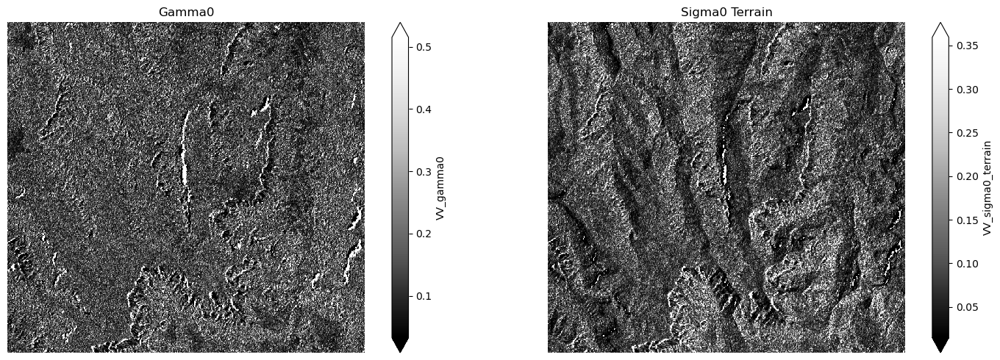

/env/lib/python3.10/site-packages/dask/core.py:133: RuntimeWarning: divide by zero encountered in log10
  return func(*(_execute_task(a, cache) for a in args))


In [14]:
# Visualise
gamma0 = ds.isel(time=0)["VV_gamma0"]
sigma0_terrain = ds.isel(time=0)["VV_sigma0_terrain"]

# Define figure
fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(15, 5), sharex=True, sharey=True)

# Display unfiltered
gamma0.plot(ax=ax0, cmap="Greys_r", robust=True)
ax0.set_aspect("equal")
ax0.set_title("Gamma0")
ax0.axis("off")

# Display filtered
sigma0_terrain.plot(ax=ax1, cmap="Greys_r", robust=True)
ax1.set_aspect("equal")
ax1.set_title("Sigma0 Terrain")
ax1.axis("off")

plt.tight_layout()
plt.show()

#### Ellipsoid $\sigma^0$

Ellipsoid sigma0, ${\sigma_t}^0$ is relative to the ground, without terrain.

For this conversion, there is not a single layer for the conversion factor, but instead involves converting to $\beta_0$ and then multiplying by the sine of the incidence angle.
The equation is as follows:

$$
\begin{aligned} 
{\sigma_e}^0 &= \beta^0 \times \sin ( \text{incidence\_angle} ) \\
&= \gamma^0 \times \text{gamma0\_to\_beta0\_ratio} \times \sin ( \text{incidence\_angle} )
\end{aligned}
$$

In [15]:
ds["VV_sigma0_ellipsoid"] = ds["VV_gamma0"] * ds["gamma0_to_beta0_ratio"] * np.sin(ds["incidence_angle"])

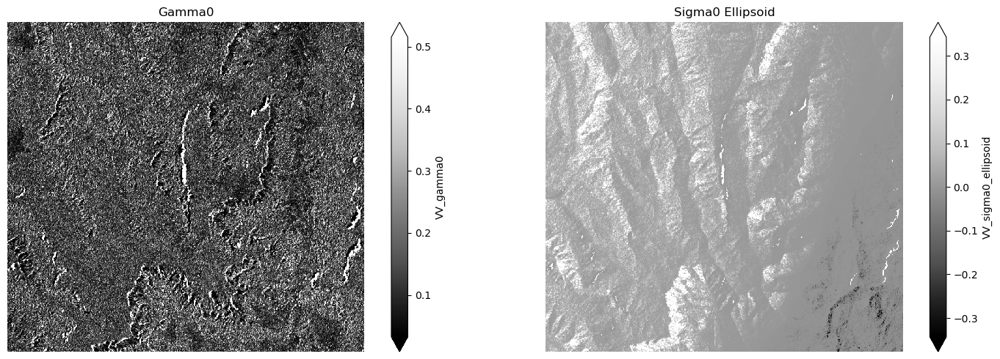

In [16]:
# Visualise
gamma0 = ds.isel(time=0)["VV_gamma0"]
sigma0_ellipsoid = ds.isel(time=0)["VV_sigma0_ellipsoid"]

# Define figure
fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(15, 5), sharex=True, sharey=True)

# Display unfiltered
gamma0.plot(ax=ax0, cmap="Greys_r", robust=True)
ax0.set_aspect("equal")
ax0.set_title("Gamma0")
ax0.axis("off")

# Display filtered
sigma0_ellipsoid.plot(ax=ax1, cmap="Greys_r", robust=True)
ax1.set_aspect("equal")
ax1.set_title("Sigma0 Ellipsoid")
ax1.axis("off")

plt.tight_layout()
plt.show()

## Converting to decibels

GA's Sentinel-1 backscatter product is provided as linear gamma0. 
For some analyses, it may be beneficial to convert the linear backscatter to decibels (dB).

The conversion equation is 
$${\gamma^0}_{\text{dB}} = 10 \times \log_{10}({\gamma^0}_\text{linear})$$

For ease here, we will just apply the decibel conversion to the unaltered backscatter data. 
The [02_demonstration.ipynb](02_demonstration.ipynb) notebook shows the typical end-to-end workflow of preparing data for analysis.

In [17]:
ds["VV_gamma0_db"] = 10*np.log10(ds["VV_gamma0"])

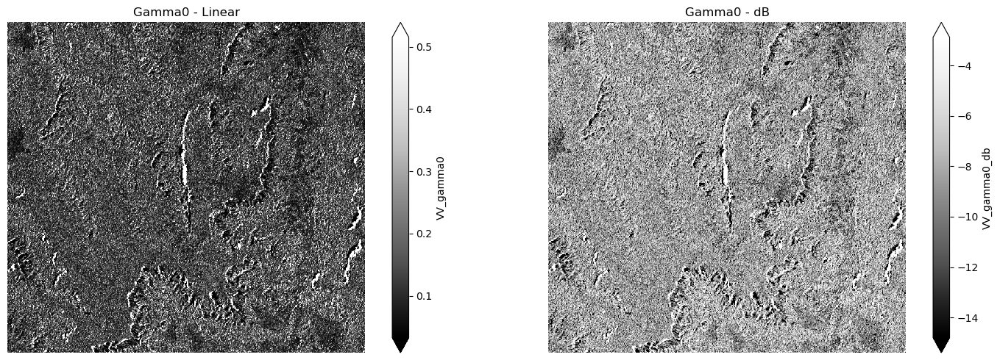

In [18]:
# Visualise
gamma0_linear = ds.isel(time=0)["VV_gamma0"]
gamma0_db = ds.isel(time=0)["VV_gamma0_db"]

# Define figure
fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(15, 5), sharex=True, sharey=True)

# Display unfiltered
gamma0_linear.plot(ax=ax0, cmap="Greys_r", robust=True)
ax0.set_aspect("equal")
ax0.set_title("Gamma0 - Linear")
ax0.axis("off")

# Display filtered
gamma0_db.plot(ax=ax1, cmap="Greys_r", robust=True)
ax1.set_aspect("equal")
ax1.set_title("Gamma0 - dB")
ax1.axis("off")

plt.tight_layout()
plt.show()